In [22]:
import os
import glob
import cv2
import numpy as np
from fastai.vision import *
from matplotlib import pyplot as plt
from pathlib import Path

In [4]:
import pandas as pd

In [5]:
df = pd.read_csv('pic_statue_english_converted.csv')

In [6]:
df.head()

,pic_id,pic_name,pic_source,relic_geograpicLocation,relic_materials,relic_creationDate,statue_name,statue_alias,statue_description,relic_creationDate_english,pic_source_english,pic_name_english,relic_materials_english,statue_name_english,statue_alias_english,statue_description_english
0,1,阿底峡坐像（江孜白居寺）,金维诺主编.中国藏传佛教雕塑全集 第1卷 彩塑.北京：北京美术摄影出版社，2002.1,西藏江孜白居寺吉祥多门塔阿底峡殿,泥塑彩绘，高约1.2米,明代,阿底峡,吉祥燃灯智、觉沃且尊者,藏传佛教噶当派祖师（982―1054）。古印度萨霍尔（今孟加拉达卡附近）人，曾任超岩寺上座，...,The Ming Dynasty,Jin weinuo editor of the. China Tibetan Buddhi...,Atisha seated（jiangzi Bai Ju temple）,"Clay painted, high about 1. 2 meters",Atisha,"Auspicious-fuel light Chi, the vision Ward and...",Tibetan Buddhism Kadampa progenitor division 9...
1,2,阿底峡大师坐像（当雄县）,张建林主编.中国藏传佛教雕塑全集 第4卷 擦擦.北京：北京美术摄影出版社，2002.1,西藏拉萨当雄县,黑褐陶质，高0.063米,后弘初期（约十二-十三世纪）,阿底峡,吉祥燃灯智、觉沃且尊者,藏传佛教噶当派祖师（982―1054）。古印度萨霍尔（今孟加拉达卡附近）人，曾任超岩寺上座，...,After Hong early about twelfth-thirteenth cent...,Zhang Jianlin editor. China Tibetan Buddhist s...,Atisha seated（damxung County）,"Dark brown ceramic, high-0. 063 m",Atisha,"Auspicious-fuel light Chi, the vision Ward and...",Tibetan Buddhism Kadampa progenitor division 9...
2,3,阿底峡与仲敦巴对坐说法像（西藏）,谢继胜主编.中国藏传佛教雕塑全集 第6卷 木雕.北京：北京美术摄影出版社，2002.1,西藏,木质线刻，长0.34米,清代,阿底峡,吉祥燃灯智、觉沃且尊者,藏传佛教噶当派祖师（982―1054）。古印度萨霍尔（今孟加拉达卡附近）人，曾任超岩寺上座，...,The Qing dynasty,Thanks following the win editor. China Tibetan...,Atisha and the SEC urge the bar to sit on sayi...,"Wooden line carved, long 0. 34 M",Atisha,"Auspicious-fuel light Chi, the vision Ward and...",Tibetan Buddhism Kadampa progenitor division 9...
3,4,头戴班智达帽阿底峡坐像（首都博物馆藏）,北京市文物事业管理局编.北京文物集粹大系 佛造像卷上.北京：北京出版社，2001.10,北京首都博物馆藏,铜鎏金，通高0.21米,明代,阿底峡,吉祥燃灯智、觉沃且尊者,藏传佛教噶当派祖师（982―1054）。古印度萨霍尔（今孟加拉达卡附近）人，曾任超岩寺上座，...,The Ming Dynasty,Beijing Cultural Relics project management Boa...,Wearing a Pandita hat Atisha seated the capita...,"Copper gilt, by high 0. 21 m",Atisha,"Auspicious-fuel light Chi, the vision Ward and...",Tibetan Buddhism Kadampa progenitor division 9...
4,5,头戴红色班智达帽阿底峡跏趺端坐像（首都博物馆藏）,北京市文物事业管理局编.北京文物集粹大系 佛造像卷上.北京：北京出版社，2001.10,北京首都博物馆藏,铜鎏金，通高0.18米,清代,阿底峡,吉祥燃灯智、觉沃且尊者,藏传佛教噶当派祖师（982―1054）。古印度萨霍尔（今孟加拉达卡附近）人，曾任超岩寺上座，...,The Qing dynasty,Beijing Cultural Relics project management Boa...,Wearing a red Pandita hat Atisha Fu sitting li...,"Copper gilt, by high 0. 18 m",Atisha,"Auspicious-fuel light Chi, the vision Ward and...",Tibetan Buddhism Kadampa progenitor division 9...


In [8]:
a = df['statue_name_english'].str.contains('Buddha', regex = False)
df[a].head()

,pic_id,pic_name,pic_source,relic_geograpicLocation,relic_materials,relic_creationDate,statue_name,statue_alias,statue_description,relic_creationDate_english,pic_source_english,pic_name_english,relic_materials_english,statue_name_english,statue_alias_english,statue_description_english
5,6,阿弥陀佛像（杭州灵隐寺飞来峰）,意匠生辉：浙江历史遗产的文化品读.杭州：浙江人民美术出版社，2003.12,浙江杭州灵隐寺飞来峰石窟,石雕,元代,阿弥陀佛（无量寿佛）,无量清净佛、无量光佛、无量寿佛、弥陀，接引佛、藏传佛教称为月巴墨佛,是佛教中西方“极乐世界”的教主，与观世音菩萨、大势至菩萨统称为西方三圣。佛经说此佛于过去世为...,The Yuan dynasty,Italian craftsmen diamonds: Zhejiang heritage ...,Amitabha like Hangzhou Lingyin Temple feilai p...,Stone,Amitabha（boundless life of Buddha）,"Measureless pure Buddha, measureless light Bud...","Buddhism in the West“Elysium,”the leader, the ..."
6,7,阿弥陀佛（交城永宁寺）,刘慧葵编著.中华名寺古刹（1-4）.台北：地球出版有限公司，1981,山西交城永宁寺,铁铸,明代,阿弥陀佛（无量寿佛）,无量清净佛、无量光佛、无量寿佛、弥陀，接引佛、藏传佛教称为月巴墨佛,是佛教中西方“极乐世界”的教主，与观世音菩萨、大势至菩萨统称为西方三圣。佛经说此佛于过去世为...,The Ming Dynasty,Liu Hui Kwai EDS. Chinese temple temple（1-4）. ...,Amitabha（jiaocheng Yongning temple）,Iron casting,Amitabha（boundless life of Buddha）,"Measureless pure Buddha, measureless light Bud...","Buddhism in the West“Elysium,”the leader, the ..."
7,8,阿弥陀佛像（北京雍和宫）,雍和宫佛像宝典.北京：北京出版社，2002.1,北京雍和宫,总高45厘米，像高26厘米，铜鎏金,清中早期,阿弥陀佛（无量寿佛）,无量清净佛、无量光佛、无量寿佛、弥陀，接引佛、藏传佛教称为月巴墨佛,是佛教中西方“极乐世界”的教主，与观世音菩萨、大势至菩萨统称为西方三圣。佛经说此佛于过去世为...,Clear in the early,Lama Temple Buddha collection. Beijing: Beijin...,Amitabha like Beijing Lama Temple）,"With a total height of 45 cm, and as high as 2...",Amitabha（boundless life of Buddha）,"Measureless pure Buddha, measureless light Bud...","Buddhism in the West“Elysium,”the leader, the ..."
8,9,阿弥陀佛像（新绛福胜寺）,金维诺主编.中国彩塑精华珍赏丛书 新绛福胜寺.太原：山西人民出版社，2004.1,山西新绛福胜寺,彩塑,元代,阿弥陀佛（无量寿佛）,无量清净佛、无量光佛、无量寿佛、弥陀，接引佛、藏传佛教称为月巴墨佛,是佛教中西方“极乐世界”的教主，与观世音菩萨、大势至菩萨统称为西方三圣。佛经说此佛于过去世为...,The Yuan dynasty,Jin weinuo editor of the. China painted sculpt...,Amitabha like 新绛 Fusheng temple）,Painted sculpture,Amitabha（boundless life of Buddha）,"Measureless pure Buddha, measureless light Bud...","Buddhism in the West“Elysium,”the leader, the ..."
9,10,无量寿佛（承德溥仁寺）,杨伯达主编.中国美术全集 雕塑篇6 元明清雕塑.北京：人民美术出版社，1988.12,河北承德溥仁寺宝相长新殿,高190厘米，座高150厘米,清代,阿弥陀佛（无量寿佛）,无量清净佛、无量光佛、无量寿佛、弥陀，接引佛、藏传佛教称为月巴墨佛,是佛教中西方“极乐世界”的教主，与观世音菩萨、大势至菩萨统称为西方三圣。佛经说此佛于过去世为...,The Qing dynasty,Yang primary up to the editor. Chinese art col...,Boundless life of Buddha Chengde PU-Jen temple）,"High 190 cm, seat height 150 cm",Amitabha（boundless life of Buddha）,"Measureless pure Buddha, measureless light Bud...","Buddhism in the West“Elysium,”the leader, the ..."


In [9]:
buddha_csv = df[a]

In [53]:
current_dir = os.getcwd()
from_dir = current_dir + '/statue_encode'
to_dir = current_dir + '/buddha_encode'

(currenr_dir, from_dir, to_dir)

('/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data',
 '/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode',
 '/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/buddha_encode')

In [15]:
for i in glob.glob(from_dir+'/*jpg'):
    print(i)

/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9229_五百罗汉第二九二尊 藏律行尊者（新都宝光寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9592_五百罗汉第三五五尊 旃檀罗尊者（新都宝光寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/7197_侍卫之三（太谷净信寺 ）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/2147_供养天像（札达县托林寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9420_五百罗汉第三�五尊 不退法尊者（苏州西园寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/1186_帝释像（平遥双林寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/4643_明王2（新绛福胜寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/5792_骑马男俑1（故宫博物院藏）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9856_五方佛坐像（乐山乌尤寺）  .jpg
/Users/pradyumna/Downloads/R

/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9421_五百罗汉第三�五尊 不退法尊者（新都宝光寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/6809_十二圆觉之三 弥勒菩萨（原平慧济寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/736_头戴花冠顶饰朝霞冠赤松德赞坐像（首都博物馆藏）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9158_五百罗汉第八十五尊 七佛难提尊者（苏州西园寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/8494_韦驮立姿像（太原多福寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/10506_天师侧身像（上海白云观）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/992_梵天像（北京海淀大慧寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9243_五百罗汉第二九一尊 持大医尊者（新都宝光寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/341_双身不动佛坐像（拉萨药王山）  .jpg
/Users/

/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/8005_唐叔虞及近侍坐像（太原晋祠）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/3483_力士像2（平遥双林寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9364_五百罗汉第二一七尊 断烦恼尊者（苏州西园寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/3938_左龛卢舍那佛（广元千佛崖石窟）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9326_五百罗汉第二四三尊 水潮声尊者（苏州西园寺）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/8151_双手捧圣物基督教天使像（泉州海外交通史博物馆）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/9958_天女像（安阳修定寺塔）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/5779_骑马铜人（故宫博物院）  .jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue/2714_茗山寺第十二号十二护法神像龛（安岳石窟）  .jpg
/Users/pradyum

In [26]:
path = Path('.')
fresco1_path = path/'fresco-1'
fresco2_path = path/'fresco-2'
statue_path = path/'statue_encode'
bbox_fresco = path/'bbox_fresco'

In [34]:
def encode_transfer(from_dir, to_dir):
    
    list1 = os.listdir(from_dir)
    
    for i in list1:
        
        image = cv2.imread(from_dir +'/'+ i)
        os.chdir(to_dir)
        save_name = i.encode('ascii', 'backslashreplace').replace(b'\\u', b'#U').replace(b'\\x', b'#U00').decode("utf-8")
        cv2.imwrite(save_name, image)
        os.chdir(currenr_dir)
        
        

In [35]:
encode_transfer(from_dir, to_dir)

In [39]:
def import_with_name(pic_name):
    
    pic_name_entities = pic_name.encode('ascii', 'backslashreplace').replace(b'\\u', b'#U').replace(b'\\x', b'#U00').decode("utf-8")
    print(type(pic_name_entities))
   # f = str(Path(statue_path/('*_' + pic_name_entities + '#U00a0#U00a0.jpg')))
    #print(f)
    print(1)
    f = str(Path(statue_path/('*_'+ pic_name_entities + '.jpg')))
    for file in glob.glob(f):
        print(2)
        return file
    #f = str(Path(statue_path/('*_' + pic_name_entities + '.#U00a0#U00a0.jpg')))
    for file in glob.glob(f):
        print(3)
        return file

In [25]:
def check_tansfer_images(current_dir, from_path, to_path, csv_file):
    
    for a,b in csv_file['pic_name'].iteritems():
        image = import_with_name(b)
        image = cv2.imread(image)
        if image is not None:
            os.chdir(to_path)
            cv2.imwrite(str(csv_file['pic_name'][a].encode('ascii', 'backslashreplace').replace(b'\\u', b'#U').replace(b'\\x', b'#U00').decode("utf-8")) + '.jpg', image)
            os.chdir(current_dir)
        else:
            csv_file.drop([a], inplace = True)

In [54]:
import_with_name('阿弥陀佛像（杭州灵隐寺飞来峰')

'6_#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U676d#U5dde#U7075#U9690#U5bfa#U98de#U6765#U5cf0#Uff09#U00a0#U00a0.jpg'

In [55]:
list_images = os.listdir('statue_encode/')
list_images[1:5]

['441_#U949f#U79bb#U6743#U50cf#Uff08#U6606#U660e#U9f99#U95e8#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg',
 '9428_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e09#U516b#U4e8c#U5c0a#U00a0#U81ea#U660e#U5c0a#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg',
 '170_#U6bd7#U5362#U6d1e#U7b2c#U516b#U53f7#U7a9f#U7b2c#U516b#U820d#U81c2#U56fe#U4e2d#U4e4b#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U5b89#U5cb3#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg',
 '823_#U91d1#U521a#U6301#U6e38#U620f#U5750#U50cf#Uff08#U672d#U8fbe#U53bf#Uff09#U00a0#U00a0.jpg']

In [66]:
def import_with_name(pic_name):
    
    pic_name_entities = str(pic_name.encode('ascii', 'backslashreplace').replace(b'\\u', b'#U').replace(b'\\x', b'#U00').decode("utf-8"))
    matching = [s for s in list_images if pic_name_entities in s]
    if len(matching)!=0:
        return matching[0]
    else:
        return None

    

In [58]:
(currenr_dir,from_dir,to_dir)

('/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data',
 '/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode',
 '/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/buddha_encode')

In [68]:
def check_transfer_images(current_dir, from_path, to_path, csv_file):
    
    for a,b in csv_file['pic_name'].iteritems():
        
        image_name = import_with_name(b)
        if image_name is not None:
            print(image_name)
            image_path = from_path + '/' + image_name
            print(image_path)

            image = cv2.imread(image_path)
            os.chdir(to_path)
            cv2.imwrite(str(csv_file['pic_id'][a]) +'.jpg' , image)
            os.chdir(current_dir)
        else:
            csv_file.drop([a], inplace = True)

In [69]:
check_transfer_images(current_dir, from_dir, to_dir, buddha_csv)

6_#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U676d#U5dde#U7075#U9690#U5bfa#U98de#U6765#U5cf0#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/6_#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U676d#U5dde#U7075#U9690#U5bfa#U98de#U6765#U5cf0#Uff09#U00a0#U00a0.jpg
7_#U963f#U5f25#U9640#U4f5b#Uff08#U4ea4#U57ce#U6c38#U5b81#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/7_#U963f#U5f25#U9640#U4f5b#Uff08#U4ea4#U57ce#U6c38#U5b81#U5bfa#Uff09#U00a0#U00a0.jpg
8_#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U5317#U4eac#U96cd#U548c#U5bab#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/8_#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U5317#U4eac#U96cd#U548c#U5bab#Uff09#U00a0#U00a0.jpg
9_#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U65b0#U7edb#U798f#U80dc#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/s

/Users/pradyumna/anaconda3/envs/dsc/lib/python3.7/site-packages/pandas/core/frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


33_#U4e0b#U5c42#U53f3#U58c1#U963f#U5f25#U9640#U4f5b#U7acb#U50cf#Uff08#U6842#U6797#U8fd8#U73e0#U6d1e#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/33_#U4e0b#U5c42#U53f3#U58c1#U963f#U5f25#U9640#U4f5b#U7acb#U50cf#Uff08#U6842#U6797#U8fd8#U73e0#U6d1e#Uff09#U00a0#U00a0.jpg
34_#U7ed3#U8dcf#U8dba#U5750#U4e8e#U83b2#U5ea7#U65e0#U91cf#U5bff#U4f5b#U50cf#Uff08#U676d#U5dde#U98de#U6765#U5cf0#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/34_#U7ed3#U8dcf#U8dba#U5750#U4e8e#U83b2#U5ea7#U65e0#U91cf#U5bff#U4f5b#U50cf#Uff08#U676d#U5dde#U98de#U6765#U5cf0#Uff09#U00a0#U00a0.jpg
35_#U89c2#U65e0#U91cf#U5bff#U4f5b#U7ecf#U53d8#U76f8#Uff08#U5927#U8db3#U5317#U5c71#U4f5b#U6e7e#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/35_#U89c2#U65e0#U91cf#U5bff#U4f5b#U7ecf#U53d8#U76f8#Uff08#U5927#U8db3#U5317#U5c71#U4f5b#U6e7e#U7

58_#U65e0#U91cf#U5bff#U4f5b#U5750#U50cf#Uff08#U5357#U4eac#U6816#U971e#U5c71#U5343#U4f5b#U5d16#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/58_#U65e0#U91cf#U5bff#U4f5b#U5750#U50cf#Uff08#U5357#U4eac#U6816#U971e#U5c71#U5343#U4f5b#U5d16#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
59_#U884c#U5112#U9020#U963f#U5f25#U9640#U4f5b#U53ca#U4e8c#U80c1#U4f8d#U83e9#U8428#U50cf#Uff08#U804a#U57ce#U5730#U533a#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/59_#U884c#U5112#U9020#U963f#U5f25#U9640#U4f5b#U53ca#U4e8c#U80c1#U4f8d#U83e9#U8428#U50cf#Uff08#U804a#U57ce#U5730#U533a#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
60_#U5357#U9f9b#U4e03#U516b#U53f7#U9f9b#U897f#U65b9#U51c0#U571f#U53d8#Uff08#U5df4#U4e2d#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/60_#U5357#U9f9b#U4e03#U516b#U5

84_#U63a5#U5f15#U4f5b#Uff08#U5927#U540c#U5927#U534e#U4e25#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/84_#U63a5#U5f15#U4f5b#Uff08#U5927#U540c#U5927#U534e#U4e25#U5bfa#Uff09#U00a0#U00a0.jpg
85_#U65e0#U91cf#U5bff#U4f5b#U4e0e#U80c1#U4f8d#Uff08#U65e5#U5580#U5219#U5730#U533a#U5eb7#U9a6c#U827e#U65fa#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/85_#U65e0#U91cf#U5bff#U4f5b#U4e0e#U80c1#U4f8d#Uff08#U65e5#U5580#U5219#U5730#U533a#U5eb7#U9a6c#U827e#U65fa#U5bfa#Uff09#U00a0#U00a0.jpg
86_#U897f#U65b9#U4e09#U5723#U4e0e#U5f1f#U5b50#U529b#U58eb#U7ec4#U50cf#Uff08#U5e7f#U5143#U9ec4#U6cfd#U5bfa#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/86_#U897f#U65b9#U4e09#U5723#U4e0e#U5f1f#U5b50#U529b#U58eb#U7ec4#U50cf#Uff08#U5e7f#U5143#U9ec4#U6cfd#U5bfa#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
88_#U65e0#U91cf#

112_#U5b97#U5580#U5df4#U4e0e#U5de6#U4fa7#U65e0#U91cf#U5bff#U4f5b#U3001#U53f3#U4fa7#U56db#U81c2#U89c2#U97f3#U7ec4#U50cf#Uff08#U62c9#U8428#U5927#U662d#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/112_#U5b97#U5580#U5df4#U4e0e#U5de6#U4fa7#U65e0#U91cf#U5bff#U4f5b#U3001#U53f3#U4fa7#U56db#U81c2#U89c2#U97f3#U7ec4#U50cf#Uff08#U62c9#U8428#U5927#U662d#U5bfa#Uff09#U00a0#U00a0.jpg
113_#U963f#U5f25#U9640#U4f5b#U4fa7#U9762#U50cf#Uff08#U592a#U539f#U6c38#U795a#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/113_#U963f#U5f25#U9640#U4f5b#U4fa7#U9762#U50cf#Uff08#U592a#U539f#U6c38#U795a#U5bfa#Uff09#U00a0#U00a0.jpg
114_#U963f#U5f25#U9640#U4f5b#U5750#U50cf#Uff08#U6d4e#U5357#U7389#U51fd#U5c71#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/114_#U963f#U5f25#U9640#U4f5b#U5750#U50cf#Uff08#U6d4e#U5357#U7

137_#U963f#U5f25#U9640#U4f5b#U53ca#U897f#U80c1#U4f8d#U83e9#U8428#Uff08#U5927#U540c#U4e91#U5188#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/137_#U963f#U5f25#U9640#U4f5b#U53ca#U897f#U80c1#U4f8d#U83e9#U8428#Uff08#U5927#U540c#U4e91#U5188#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
138_#U4faf#U5bb6#U6e7e#U7b2c#U4e8c#U53f7#U897f#U65b9#U4e09#U5723#U9f9b#U4e3b#U5c0a#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U5b89#U5cb3#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/138_#U4faf#U5bb6#U6e7e#U7b2c#U4e8c#U53f7#U897f#U65b9#U4e09#U5723#U9f9b#U4e3b#U5c0a#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U5b89#U5cb3#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
139_#U65e0#U91cf#U5bff#U4f5b#U53ca#U954f#U91d1#U94dc#U9f9b#Uff08#U5317#U4eac#U767d#U5854#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/139_#U65e0#U91cf#U5bff#U4f5b#U5

165_#U5f25#U9640#U4e09#U5c0a#U7acb#U50cf#Uff08#U66f2#U9633#U4fee#U5fb7#U5bfa#Uff09.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/165_#U5f25#U9640#U4e09#U5c0a#U7acb#U50cf#Uff08#U66f2#U9633#U4fee#U5fb7#U5bfa#Uff09.jpg
166_#U572d#U5f62#U9f9b#U957f#U5bff#U4f5b#U50cf#Uff08#U961c#U65b0#U6d77#U68e0#U5c71#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/166_#U572d#U5f62#U9f9b#U957f#U5bff#U4f5b#U50cf#Uff08#U961c#U65b0#U6d77#U68e0#U5c71#Uff09#U00a0#U00a0.jpg
168_#U65e0#U91cf#U5bff#U4f5b#U5750#U50cf#Uff08#U672d#U8fbe#U53bf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/168_#U65e0#U91cf#U5bff#U4f5b#U5750#U50cf#Uff08#U672d#U8fbe#U53bf#Uff09#U00a0#U00a0.jpg
170_#U6bd7#U5362#U6d1e#U7b2c#U516b#U53f7#U7a9f#U7b2c#U516b#U820d#U81c2#U56fe#U4e2d#U4e4b#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U5b89#U5cb3#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/

190_#U6b63#U58c1#U963f#U5f25#U9640#U4f5b#Uff08#U5929#U6c34#U9ea6#U79ef#U5c71#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/190_#U6b63#U58c1#U963f#U5f25#U9640#U4f5b#Uff08#U5929#U6c34#U9ea6#U79ef#U5c71#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
191_#U65e0#U91cf#U5bff#U4f5b#Uff08#U62c9#U8428#U5e03#U8fbe#U62c9#U5bab#U6bbf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/191_#U65e0#U91cf#U5bff#U4f5b#Uff08#U62c9#U8428#U5e03#U8fbe#U62c9#U5bab#U6bbf#Uff09#U00a0#U00a0.jpg
192_#U897f#U65b9#U4e09#U5723#U7acb#U50cf#Uff08#U5317#U4eac#U9996#U90fd#U535a#U7269#U9986#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/192_#U897f#U65b9#U4e09#U5723#U7acb#U50cf#Uff08#U5317#U4eac#U9996#U90fd#U535a#U7269#U9986#Uff09#U00a0#U00a0.jpg
193_#U7ed3#U8dcf#U8dba#U5750#U4e8e#U83b2#U5ea7#U963f#U5f25#U9640#U4f5b#U50cf#Uff08#U676d#U5dde

218_#U4f17#U5999#U5802#U963f#U5f25#U9640#U4f5b#U7acb#U50cf#Uff08#U4ecb#U4f11#U5927#U7f57#U5bab#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/218_#U4f17#U5999#U5802#U963f#U5f25#U9640#U4f5b#U7acb#U50cf#Uff08#U4ecb#U4f11#U5927#U7f57#U5bab#Uff09#U00a0#U00a0.jpg
219_#U897f#U65b9#U963f#U5f25#U9640#U4f5b#Uff08#U5927#U540c#U5584#U5316#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/219_#U897f#U65b9#U963f#U5f25#U9640#U4f5b#Uff08#U5927#U540c#U5584#U5316#U5bfa#Uff09#U00a0#U00a0.jpg
220_#U660e#U738b#U6bbf#U897f#U65b9#U4e09#U5723#U4e4b#U963f#U5f25#U9640#U4f5b#Uff08#U4ecb#U4f11#U4e91#U5cf0#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/220_#U660e#U738b#U6bbf#U897f#U65b9#U4e09#U5723#U4e4b#U963f#U5f25#U9640#U4f5b#Uff08#U4ecb#U4f11#U4e91#U5cf0#U5bfa#Uff09#U00a0#U00a0.jpg
221_#U63a5#U5f15#U4f5b#U7acb#U50cf

240_#U5934#U6234#U9876#U9970#U963f#U5f25#U9640#U4f5b#U5934#U82b1#U51a0#U677e#U8d5e#U5e72#U5e03#U5750#U50cf#Uff08#U9996#U90fd#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/240_#U5934#U6234#U9876#U9970#U963f#U5f25#U9640#U4f5b#U5934#U82b1#U51a0#U677e#U8d5e#U5e72#U5e03#U5750#U50cf#Uff08#U9996#U90fd#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
241_#U65e0#U91cf#U5bff#U4f5b#U5750#U59ff#U50cf#Uff08#U897f#U85cf#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/241_#U65e0#U91cf#U5bff#U4f5b#U5750#U59ff#U50cf#Uff08#U897f#U85cf#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
329_#U963f#Ufffdz#U4f5b(#U590f#U53bf#U4f59#U5e86#U7985#U9662)#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/329_#U963f#Ufffdz#U4f5b(#U590f#U53bf#U4f59#U5e86#U7985#U9662)#U00a0#U00a0.jpg
330_#U4e0d#U52a8

457_#U53f3#U624b#U7ed3#U4e0e#U613f#U5370#Uff0c#U5de6#U624b#U5939#U7f20#U679d#U82b1#U4e4b#U6551#U5ea6#U4f5b#U6bcd#U5750#U50cf#Uff08#U676d#U5dde#U98de#U6765#U5cf0#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/457_#U53f3#U624b#U7ed3#U4e0e#U613f#U5370#Uff0c#U5de6#U624b#U5939#U7f20#U679d#U82b1#U4e4b#U6551#U5ea6#U4f5b#U6bcd#U5750#U50cf#Uff08#U676d#U5dde#U98de#U6765#U5cf0#Uff09#U00a0#U00a0.jpg
459_#U7ed3#U8dcf#U8dba#U5750#U83b2#U82b1#U5ea7#U767d#U5ea6#U6bcd#U50cf#Uff08#U6c5f#U5b5c#U767d#U5c45#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/459_#U7ed3#U8dcf#U8dba#U5750#U83b2#U82b1#U5ea7#U767d#U5ea6#U6bcd#U50cf#Uff08#U6c5f#U5b5c#U767d#U5c45#U5bfa#Uff09#U00a0#U00a0.jpg
460_#U6551#U5ea6#U4f5b#U6bcd#U7acb#U50cf#Uff08#U5317#U4eac#U6545#U5bab#U535a#U7269#U9662#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/4

716_#U957f#U5bff#U4f5b#U5750#U50cf#U4e4b#U4e00#Uff08#U5317#U4eac#U96cd#U548c#U5bab#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/716_#U957f#U5bff#U4f5b#U5750#U50cf#U4e4b#U4e00#Uff08#U5317#U4eac#U96cd#U548c#U5bab#Uff09#U00a0#U00a0.jpg
717_#U957f#U5bff#U4f5b#U5750#U50cf#U4e4b#U4e8c#Uff08#U5317#U4eac#U96cd#U548c#U5bab#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/717_#U957f#U5bff#U4f5b#U5750#U50cf#U4e4b#U4e8c#Uff08#U5317#U4eac#U96cd#U548c#U5bab#Uff09#U00a0#U00a0.jpg
729_#U6301#U4e16#U83e9#U8428#U5750#U50cf#Uff08#U5317#U4eac#U6545#U5bab#U535a#U7269#U9662#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/729_#U6301#U4e16#U83e9#U8428#U5750#U50cf#Uff08#U5317#U4eac#U6545#U5bab#U535a#U7269#U9662#Uff09#U00a0#U00a0.jpg
730_#U6301#U4e16#U83e9#U8428#U5750#U50cf#Uff08#U62c9#U8428#U5e03#U8fbe#U62c9#U5bab#Uff09#U00a0

855_#U5927#U65b9#U4fbf#U4f5b#U62a5#U6069#U7ecf#U53d8#U76f8#U7f57#U4e91#Uff08#U5927#U8db3#U5b9d#U9876#U5c71#U5927#U4f5b#U6e7e#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/855_#U5927#U65b9#U4fbf#U4f5b#U62a5#U6069#U7ecf#U53d8#U76f8#U7f57#U4e91#Uff08#U5927#U8db3#U5b9d#U9876#U5c71#U5927#U4f5b#U6e7e#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
857_#U5927#U65b9#U4fbf#U4f5b#U62a5#U6069#U7ecf#U53d8#U76f8#U5916#U9053#Uff08#U5927#U8db3#U5b9d#U9876#U5c71#U5927#U4f5b#U6e7e#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/857_#U5927#U65b9#U4fbf#U4f5b#U62a5#U6069#U7ecf#U53d8#U76f8#U5916#U9053#Uff08#U5927#U8db3#U5b9d#U9876#U5c71#U5927#U4f5b#U6e7e#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
858_#U5927#U65b9#U4fbf#U4f5b#U62a5#U6069#U7ecf#U53d8#U76f8#U5439#U7b1b#U5973#Uff08#U5927#U8db3#U5b9d#U9876#U5c71#U5927#U4f5b#U6e7e#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downlo

1250_#U91ca#U8fe6#U4f5b#U4e0e#U591a#U5b9d#U4f5b#U5e76#U5750#U53ca#U4ea4#U811a#U83e9#U8428#U3001#U80c1#U4f8d#U83e9#U8428#U7ec4#U50cf#Uff08#U4e1c#U4eac#U79c1#U4eba#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/1250_#U91ca#U8fe6#U4f5b#U4e0e#U591a#U5b9d#U4f5b#U5e76#U5750#U53ca#U4ea4#U811a#U83e9#U8428#U3001#U80c1#U4f8d#U83e9#U8428#U7ec4#U50cf#Uff08#U4e1c#U4eac#U79c1#U4eba#U85cf#Uff09#U00a0#U00a0.jpg
1251_#U91ca#U8fe6#U591a#U5b9d#U4e8c#U4f5b#U5e76#U5750#U8bf4#U6cd5#U50cf#Uff08#U7518#U8083#U7701#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/1251_#U91ca#U8fe6#U591a#U5b9d#U4e8c#U4f5b#U5e76#U5750#U8bf4#U6cd5#U50cf#Uff08#U7518#U8083#U7701#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
1511_#U5fff#U6012#U4f5b#U6bcd#U7acb#U59ff#U50cf#Uff08#U897f#U85cf#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artifici

1760_#U5341#U5927#U5f1f#U5b50#U4e4b#U56db#Uff08#U96b0#U53bf#U5c0f#U897f#U5929#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/1760_#U5341#U5927#U5f1f#U5b50#U4e4b#U56db#Uff08#U96b0#U53bf#U5c0f#U897f#U5929#Uff09#U00a0#U00a0.jpg
1761_#U5341#U5927#U5f1f#U5b50#U4e4b#U4e94#Uff08#U96b0#U53bf#U5c0f#U897f#U5929#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/1761_#U5341#U5927#U5f1f#U5b50#U4e4b#U4e94#Uff08#U96b0#U53bf#U5c0f#U897f#U5929#Uff09#U00a0#U00a0.jpg
1762_#U5341#U5927#U5f1f#U5b50#U4e4b#U516d#Uff08#U96b0#U53bf#U5c0f#U897f#U5929#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/1762_#U5341#U5927#U5f1f#U5b50#U4e4b#U516d#Uff08#U96b0#U53bf#U5c0f#U897f#U5929#Uff09#U00a0#U00a0.jpg
1763_#U5341#U5927#U5f1f#U5b50#U4e4b#U4e03#Uff08#U96b0#U53bf#U5c0f#U897f#U5929#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/

1934_#U4f9b#U517b#U83e9#U84282#Uff08#U5927#U540c#U4e0b#U534e#U4e25#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/1934_#U4f9b#U517b#U83e9#U84282#Uff08#U5927#U540c#U4e0b#U534e#U4e25#U5bfa#Uff09#U00a0#U00a0.jpg
1935_#U4f9b#U517b#U50cf#Uff08#U5e73#U9065#U53cc#U6797#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/1935_#U4f9b#U517b#U50cf#Uff08#U5e73#U9065#U53cc#U6797#U5bfa#Uff09#U00a0#U00a0.jpg
1936_#U4f9b#U517b#U83e9#U8428#U50cf#Uff08#U4e94#U53f0#U5c71#U5357#U7985#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/1936_#U4f9b#U517b#U83e9#U8428#U50cf#Uff08#U4e94#U53f0#U5c71#U5357#U7985#U5bfa#Uff09#U00a0#U00a0.jpg
1937_#U4f9b#U517b#U83e9#U8428#U50cf#Uff08#U4e94#U53f0#U5c71#U4f5b#U5149#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_e

3254_#U5177#U97f3#U4f5b#U6bcd#U50cf#Uff08#U5317#U4eac#U96cd#U548c#U5bab#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/3254_#U5177#U97f3#U4f5b#U6bcd#U50cf#Uff08#U5317#U4eac#U96cd#U548c#U5bab#Uff09#U00a0#U00a0.jpg
3255_#U5999#U97f3#U5929#U5973#U6000#U62b1#U7435#U7436#U50cf#Uff08#U6d77#U897f#U5b81#U6e5f#U4e2d#U5854#U5c14#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/3255_#U5999#U97f3#U5929#U5973#U6000#U62b1#U7435#U7436#U50cf#Uff08#U6d77#U897f#U5b81#U6e5f#U4e2d#U5854#U5c14#U5bfa#Uff09#U00a0#U00a0.jpg
3259_#U7a7a#U738b#U4f5b#Uff08#U4ecb#U4f11#U4e91#U5cf0#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/3259_#U7a7a#U738b#U4f5b#Uff08#U4ecb#U4f11#U4e91#U5cf0#U5bfa#Uff09#U00a0#U00a0.jpg
3260_#U7a7a#U738b#U4f5b#U53ca#U963f#U96be#U3001#U8fe6#U53f6#U50cf1#Uff08#U4ecb#U4f11#U4e91#U5cf0#U5bfa#Uff09#U00

3784_#U67f3#U672c#U5c0a#U5341#U70bc#U56fe#U7b2c#U56db#U525c#U773c#Uff08#U5b89#U5cb3#U6bd7#U5362#U6d1e#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/3784_#U67f3#U672c#U5c0a#U5341#U70bc#U56fe#U7b2c#U56db#U525c#U773c#Uff08#U5b89#U5cb3#U6bd7#U5362#U6d1e#Uff09#U00a0#U00a0.jpg
3785_#U67f3#U672c#U5c0a#U5341#U70bc#U56fe#U7b2c#U4e94#U5272#U8033#Uff08#U5b89#U5cb3#U6bd7#U5362#U6d1e#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/3785_#U67f3#U672c#U5c0a#U5341#U70bc#U56fe#U7b2c#U4e94#U5272#U8033#Uff08#U5b89#U5cb3#U6bd7#U5362#U6d1e#Uff09#U00a0#U00a0.jpg
3786_#U67f3#U672c#U5c0a#U5341#U70bc#U56fe#U7b2c#U516d#U70bc#U5fc3#Uff08#U5b89#U5cb3#U6bd7#U5362#U6d1e#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/3786_#U67f3#U672c#U5c0a#U5341#U70bc#U56fe#U7b2c#U516d#U70bc#U5fc3#Uff08#U5b89#U5cb3#U6bd7#U5362#U6d1e#Uff09#U00a0#U0

3932_#U897f#U58c1#U4e2d#U592e#U5927#U5362#U820d#U90a3#U4f5b#Uff08#U6d1b#U9633#U9f99#U95e8#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/3932_#U897f#U58c1#U4e2d#U592e#U5927#U5362#U820d#U90a3#U4f5b#Uff08#U6d1b#U9633#U9f99#U95e8#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
3933_#U897f#U58c1#U4e2d#U592e#U5927#U5362#U820d#U90a3#U4f5b#U5934#U90e8#Uff08#U6d1b#U9633#U9f99#U95e8#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/3933_#U897f#U58c1#U4e2d#U592e#U5927#U5362#U820d#U90a3#U4f5b#U5934#U90e8#Uff08#U6d1b#U9633#U9f99#U95e8#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
3934_#U6b63#U58c1#U5362#U820d#U90a3#U4f5b#U5750#U50cf#Uff08#U5b89#U9633#U5927#U7559#U5723#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/3934_#U6b63#U58c1#U5362#U820d#U90a3#U4f5b#U5750#U50cf#Uff08#U5b89#U9633#U5927#U7559#U5723#U7a9f#Uf

5267_#U6bd7#U5362#U906e#U90a3#U4f5b#Uff08#U6cf0#U5c71#U7075#U5ca9#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/5267_#U6bd7#U5362#U906e#U90a3#U4f5b#Uff08#U6cf0#U5c71#U7075#U5ca9#U5bfa#Uff09#U00a0#U00a0.jpg
5268_#U6bd7#U5362#U906e#U90a3#U4f5b#U50cf#Uff08#U676d#U5dde#U51c0#U6148#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/5268_#U6bd7#U5362#U906e#U90a3#U4f5b#U50cf#Uff08#U676d#U5dde#U51c0#U6148#U5bfa#Uff09#U00a0#U00a0.jpg
5269_#U6bd7#U5362#U4f5b#U50cf#Uff08#U5927#U540c#U5584#U5316#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/5269_#U6bd7#U5362#U4f5b#U50cf#Uff08#U5927#U540c#U5584#U5316#U5bfa#Uff09#U00a0#U00a0.jpg
5270_#U6bd7#U5362#U4f5b#U5750#U50cf#Uff08#U6d2a#U6d1e#U5e7f#U80dc#U4e0a#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Dat

5732_#U4e03#U4f5b#U50cf#U4e4b#U4e09#Uff08#U6545#U5bab#U535a#U7269#U9662#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/5732_#U4e03#U4f5b#U50cf#U4e4b#U4e09#Uff08#U6545#U5bab#U535a#U7269#U9662#U85cf#Uff09#U00a0#U00a0.jpg
5753_#U91ca#U8fe6#U725f#U5c3c#U4f5b#U4e0e#U4e03#U5927#U836f#U5e08#Uff08#U62c9#U8428#U5e03#U8fbe#U62c9#U5bab#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/5753_#U91ca#U8fe6#U725f#U5c3c#U4f5b#U4e0e#U4e03#U5927#U836f#U5e08#Uff08#U62c9#U8428#U5e03#U8fbe#U62c9#U5bab#Uff09#U00a0#U00a0.jpg
6168_#U4e3b#U5ba4#U5357#U58c1#U524d#U4e09#U8eab#U4f5b#U7acb#U50cf#U4e4b#U4e00#Uff08#U6566#U714c#U83ab#U9ad8#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/6168_#U4e3b#U5ba4#U5357#U58c1#U524d#U4e09#U8eab#U4f5b#U7acb#U50cf#U4e4b#U4e00#Uff08#U6566#U714c#U83ab#U9ad8#U7a9f#Uff09#U00a0#U00a0.jpg
6169

6474_#U72ee#U9762#U4f5b#U6bcd#U7acb#U50cf#Uff08#U5317#U4eac#U6545#U5bab#U535a#U7269#U9662#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/6474_#U72ee#U9762#U4f5b#U6bcd#U7acb#U50cf#Uff08#U5317#U4eac#U6545#U5bab#U535a#U7269#U9662#Uff09#U00a0#U00a0.jpg
6475_#U72ee#U9762#U4f5b#U6bcd#U7acb#U50cf#Uff08#U9996#U90fd#U535a#U7269#U9986#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/6475_#U72ee#U9762#U4f5b#U6bcd#U7acb#U50cf#Uff08#U9996#U90fd#U535a#U7269#U9986#Uff09#U00a0#U00a0.jpg
6476_#U72ee#U9762#U4f5b#U6bcd#U821e#U7acb#U50cf#Uff08#U897f#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/6476_#U72ee#U9762#U4f5b#U6bcd#U821e#U7acb#U50cf#Uff08#U897f#U85cf#Uff09#U00a0#U00a0.jpg
6477_#U72ee#U9762#U4f5b#U6bcd#U821e#U7acb#U50cf#Uff08#U6d1b#U9686#U53bf#U571f#U767b#U8fbe#U6770#U6797#U5bfa#Uff09#U00a0#U00a0.jpg
/Users

7303_#U91ca#U8fe6#U725f#U5c3c#U8bf4#U6cd5#U50cf#Uff08#U4e94#U53f0#U5c71#U78a7#U5c71#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/7303_#U91ca#U8fe6#U725f#U5c3c#U8bf4#U6cd5#U50cf#Uff08#U4e94#U53f0#U5c71#U78a7#U5c71#U5bfa#Uff09#U00a0#U00a0.jpg
7304_#U672c#U5c0a#U5982#U6765#U4f5b#U50cf#Uff08#U6566#U714c#U83ab#U9ad8#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/7304_#U672c#U5c0a#U5982#U6765#U4f5b#U50cf#Uff08#U6566#U714c#U83ab#U9ad8#U7a9f#Uff09#U00a0#U00a0.jpg
7305_#U5367#U4f5b#U94dc#U50cf#Uff08#U5317#U4eac#U5367#U4f5b#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/7305_#U5367#U4f5b#U94dc#U50cf#Uff08#U5317#U4eac#U5367#U4f5b#U5bfa#Uff09#U00a0#U00a0.jpg
7306_#U7389#U4f5b#U5750#U50cf#Uff08#U4e0a#U6d77#U7389#U4f5b#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artifici

9158_#U4e94#U767e#U7f57#U6c49#U7b2c#U516b#U5341#U4e94#U5c0a#U00a0#U4e03#U4f5b#U96be#U63d0#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/9158_#U4e94#U767e#U7f57#U6c49#U7b2c#U516b#U5341#U4e94#U5c0a#U00a0#U4e03#U4f5b#U96be#U63d0#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
9161_#U4e94#U767e#U7f57#U6c49#U7b2c#U516b#U00a0#U65bd#U5e62#U65e0#U57a2#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/9161_#U4e94#U767e#U7f57#U6c49#U7b2c#U516b#U00a0#U65bd#U5e62#U65e0#U57a2#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
9164_#U4e94#U767e#U7f57#U6c49#U7b2c#U7b2c#U4e03#U5341#U516d#U5c0a#U00a0#U4e0d#U7a7a#U4e0d#U6709#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Pai

9352_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e8c#U4e94#U4e00#U5c0a#U00a0#U68b5#U97f3#U5929#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/9352_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e8c#U4e94#U4e00#U5c0a#U00a0#U68b5#U97f3#U5929#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
9353_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e8c#U4e94#U4e00#U5c0a#U00a0#U68b5#U97f3#U5929#U5c0a#U8005#Uff08#U65b0#U90fd#U5b9d#U5149#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/9353_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e8c#U4e94#U4e00#U5c0a#U00a0#U68b5#U97f3#U5929#U5c0a#U8005#Uff08#U65b0#U90fd#U5b9d#U5149#U5bfa#Uff09#U00a0#U00a0.jpg
9375_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e5d#U5341#U516b#U5c0a#U00a0#U6cd5#U738b#U83e9#U63d0#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artifici

9562_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e09#U56db#U516d#U5c0a#U00a0#U9e20#U820d#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/9562_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e09#U56db#U516d#U5c0a#U00a0#U9e20#U820d#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
9563_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e09#U56db#U516d#U5c0a#U00a0#U9e20#U820d#U5c0a#U5c0a#U8005#Uff08#U65b0#U90fd#U5b9d#U5149#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/9563_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e09#U56db#U516d#U5c0a#U00a0#U9e20#U820d#U5c0a#U5c0a#U8005#Uff08#U65b0#U90fd#U5b9d#U5149#U5bfa#Uff09#U00a0#U00a0.jpg
9575_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e09#U4e94#Ufffd#U5c0a#U00a0#U5927#U836f#U5c0a#U5c0a#U8005#U00a0#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/

9837_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e00#U4e94#U4e09#U5c0a#U00a0#U5149#U8000#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/9837_#U4e94#U767e#U7f57#U6c49#U7b2c#U4e00#U4e94#U4e09#U5c0a#U00a0#U5149#U8000#U5c0a#U8005#Uff08#U82cf#U5dde#U897f#U56ed#U5bfa#Uff09#U00a0#U00a0.jpg
9854_#U4e94#U65b9#U4f5b#Uff08#U5927#U540c#U4e0a#U534e#U4e25#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/9854_#U4e94#U65b9#U4f5b#Uff08#U5927#U540c#U4e0a#U534e#U4e25#U5bfa#Uff09#U00a0#U00a0.jpg
9855_#U4e94#U65b9#U4f5b#Uff08#U96b0#U53bf#U5c0f#U897f#U5929#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/9855_#U4e94#U65b9#U4f5b#Uff08#U96b0#U53bf#U5c0f#U897f#U5929#Uff09#U00a0#U00a0.jpg
9856_#U4e94#U65b9#U4f5b#U5750#U50cf#Uff08#U4e50#U5c71#U4e4c#U5c24#U5bfa#Uff09#U00a0#U00a0.jpg
/Users

10291_#U524d#U58c1#U836f#U5e08#U4f5b#Uff08#U5b50#U957f#U949f#U5c71#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/10291_#U524d#U58c1#U836f#U5e08#U4f5b#Uff08#U5b50#U957f#U949f#U5c71#U77f3#U7a9f#Uff09#U00a0#U00a0.jpg
10295_#U5750#U59ff#U836f#U5e08#U4f5b#U4e0e#U516b#U5927#U83e9#U8428#U7acb#U50cf#Uff08#U5b89#U5cb3#U5343#U4f5b#U5be8#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/10295_#U5750#U59ff#U836f#U5e08#U4f5b#U4e0e#U516b#U5927#U83e9#U8428#U7acb#U50cf#Uff08#U5b89#U5cb3#U5343#U4f5b#U5be8#Uff09#U00a0#U00a0.jpg
10297_#U4e2d#U836f#U5e08#U4f5b#U3001#U5de6#U65e5#U5149#U83e9#U8428#U3001#U53f3#U6708#U5149#U83e9#U8428#U4e09#U5c0a#U9f9b#Uff08#U6c5f#U6d25#U9ad8#U576a#U77f3#U4f5b#U5bfa#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/10297_#U4e2d#U836f#U5e08#U4f5b#U3001#U5de6#U65e5#U5149#U83e9#U8428#U3

10827_#U5934#U633d#U9ad8#U9afb#U6234#U82b1#U51a0#U516b#U81c2#U901f#U52c7#U4f5b#U6bcd#U5750#U50cf#Uff08#U9996#U90fd#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/10827_#U5934#U633d#U9ad8#U9afb#U6234#U82b1#U51a0#U516b#U81c2#U901f#U52c7#U4f5b#U6bcd#U5750#U50cf#Uff08#U9996#U90fd#U535a#U7269#U9986#U85cf#Uff09#U00a0#U00a0.jpg
10981_#U65c3#U6a80#U4f5b#U7acb#U50cf#Uff08#U6545#U5bab#U535a#U7269#U9662#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/10981_#U65c3#U6a80#U4f5b#U7acb#U50cf#Uff08#U6545#U5bab#U535a#U7269#U9662#U85cf#Uff09#U00a0#U00a0.jpg
10982_#U65c3#U6a80#U4f5b#U7acb#U59ff#U50cf#U4e4b#U4e00#Uff08#U6545#U5bab#U535a#U7269#U9662#U85cf#Uff09#U00a0#U00a0.jpg
/Users/pradyumna/Downloads/Research/DSC/Artificial-Painting/Dunhuang Data/statue_encode/10982_#U65c3#U6a80#U4f5b#U7acb#U59ff#U50cf#U4e4b#U4e00#Uff08#U6545#U5bab#U535a#U7269#U9662#U8

In [70]:
ls

Buddha_statue_Data.ipynb
CSV/
CSV.zip
DTP_Tagging.zip
Dunhuang Data/
Dunhuang Data.zip
OneDrive_1_3-17-2020.zip
Springer Ebooks.pdf
Werfel_Termite_contruction_Science_14.pdf
bb_correction.ipynb
bounding_box_correction.ipynb
buddha/
buddha1/
buddha1.csv
buddha_encode/
buddha_pics/
d.csv
dunhuang_tags.csv
face_detection.ipynb
fresco-1/
fresco-1.zip
fresco-2/
fresco-2.zip
mark1.ipynb
modified_tags.csv
modifying_data_statues.ipynb
pic_fresco_english_converted.csv
pic_statue_english_converted.csv
statue/
statue 2/
statue.zip
statue_encode/
storytelling_from_data_v2.html
table_face_fresco.sql
table_face_statue.csv
table_face_statue.sql
table_pic_fresco.sql
table_pic_statue.csv
table_pic_statue.sql


In [71]:
len(os.listdir('buddha_encode/'))

702

In [72]:
buddha_csv.to_csv('buddha_metadata.csv')

In [74]:
df_faces = pd.read_csv('table_face_statue.csv')
df_faces.head(10)

,face_id,face_x,face_y,face_width,face_height,pic_id,pic_name
0,'1','645','422','266','245','1256','宦官2（太原晋祠）
1,'2','733','441','242','203','1257','宦官3（太原晋祠）
2,'3','662','452','252','222','1258','宦官4(太原晋祠）
3,'4','636','437','222','189','1259','宦官5（太原晋祠）
4,'5','458','366','416','401','1260','着衣式宦官立俑（咸阳汉阳陵博物馆藏）
5,'6','347','259','177','190','1261','宦者俑二身（新疆维吾尔自治区博物馆藏）
6,'7','1045','278','184','182','1261','宦者俑二身（新疆维吾尔自治区博物馆藏）
7,'8','677','363','121','127','1262','圭形龛上方绿度母、左下黄财神、右下财源天母像（阜新海棠山）
8,'9','502','539','277','184','1263','黄布禄王金刚坐像（北京故宫博物院）
9,'10','634','588','282','171','1264','黄布禄金刚坐像（北京故宫博物院）


In [81]:
#df_faces = df_faces.drop(['pic_name'], axis = 1)
df_faces.head(5)    

,face_id,face_x,face_y,face_width,face_height,pic_id
0,'1','645','422','266','245','1256'
1,'2','733','441','242','203','1257'
2,'3','662','452','252','222','1258'
3,'4','636','437','222','189','1259'
4,'5','458','366','416','401','1260'


In [84]:
for col in list(df_faces):
    df_faces[col] = df_faces[col].apply(lambda x: int(x.replace('"', '').replace("'", "")))

In [85]:
df_faces.head()

,face_id,face_x,face_y,face_width,face_height,pic_id
0,1,645,422,266,245,1256
1,2,733,441,242,203,1257
2,3,662,452,252,222,1258
3,4,636,437,222,189,1259
4,5,458,366,416,401,1260


In [86]:
df_faces = df_faces.drop(['face_id'], axis =1)

In [87]:
df_faces.head()

,face_x,face_y,face_width,face_height,pic_id
0,645,422,266,245,1256
1,733,441,242,203,1257
2,662,452,252,222,1258
3,636,437,222,189,1259
4,458,366,416,401,1260


In [88]:
########## Performing Non Maximum suppression for cleaning bounding boxes #######

In [124]:
df_faces['face_x2']=df_faces['face_x']+df_faces['face_width']

In [125]:
df_faces['face_y2'] = df_faces['face_y']+df_faces['face_height']

In [128]:
df_faces = df_faces.drop(['face_width','face_height'], axis = 1)

In [205]:
df_faces[df_faces['pic_id']==10]

,face_x,face_y,pic_id,face_x2,face_y2


In [148]:
dic ={}
dic_modified = {}
for i in df_faces['pic_id']:
    dic[i] = df_faces[df_faces['pic_id']==i].drop(['pic_id'],axis=1).to_numpy()

    


In [149]:
def n_m_s(bb, thresh):
    
    if len(bb) == 0:
        return []
    
    bb = bb.astype("float")
    
    real_box = []
    
    
    #Coordinates of Bounding Boxes
    
    x1 = bb[:,0]
    x2 = bb[:,2]
    y1 = bb[:,1]  
    y2 = bb[:,3]
    
    
    
    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    
    sorted_list = np.argsort(y2)
    
    while len(sorted_list)>0:
        
        
        last_idx = len(sorted_list) -1
        
        a = sorted_list[last_idx]
        
        
        real_box.append(a)
        
        xx1 = np.maximum(x1[a], x1[sorted_list[:last_idx]])
        yy1 = np.maximum(y1[a], y1[sorted_list[:last_idx]])
        xx2 = np.minimum(x2[a], x2[sorted_list[:last_idx]])
        yy2 = np.minimum(y2[a], y2[sorted_list[:last_idx]])
        
        
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        
        
        over_lap = (w*h)/areas[sorted_list[:last_idx]]
        
        sorted_list = np.delete(sorted_list, np.concatenate(([last_idx], np.where(over_lap > thresh)[0])))
        
    return bb[real_box].astype("int")
    
    

In [150]:
for i in dic:
    
    bb = dic[i]
    print(len(bb))
    
    tt = n_m_s(bb,0.15)
    
    print(len(tt))
    dic_modified[i] = tt
    

1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
2
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
2
1
2
1
3
3
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
7
7
2
2
7
7
2
2
1
1
1
1
1
1
1
1
1
1
1
1
8
2
5
1
4
1
38
3
18
5
4
1
29
6
4
1
7
3
65
36
37
18
7
1
4
1
16
4
15
3
2
1
18
3
126
39
32
9
4
1
5
1
4
1
4
1
4
1
11
4
43
11
5
1
16
5
9
2
12
3
94
49
4
1
12
3
4
1
5
1
14
3
14
9
18
3
4
1
21
10
15
3
2
1
4
1
4
1
5
1
13
4
19
6
6
1
3
1
14
3
36
9
8
2
7
3
23
11
155
37
9
4
6
1
5
1
2
1
4
1
27
8
5
1
73
19
4
2
15
3
8
2
10
2
6
1
12
3
4
1
4
1
17
5
3
1
5
1
10
2
5
1
7
1
4
1
26
8
5
1
4
1
38
17
5
1
5
1
3
1
6
1
5
1
4
1
5
1
5
2
4
1
6
1
12
6
4
1
4
1
35
13
12
3
4
1
6
1
5
1
4
1
13
8
30
15
12
2
5
1
18
3
4
1
7
3
19
4
4
1
5
1
40
9
1
1
5
1
4
1
8
4
4
1
38
18
2
1
11
2
8
2
4
1
4
1
5
1
18
5
4
1
2
1
11
2
12
3
15
5
4
1
5
1
7
2
7
2
28
5
5
1
4
1
12
3
5
1
4
1
4
1
25
9
31
7
4
1
4
1
24
5
12
3
4
1
6
1
10
3
4
1
16
3
35
8
4
1
12
3
12
3
36
8
4
1
11
3
4
1
4
1
4
1
16
3
10
2
4
1
14
3
7
1
4
1
4
1
55
13
5
1
4
1
4
1
2
1
4
1
5
1


1
1
1
1
1
2
1
1
1
1
1
1
1
14
7
9
9
1
1
1
1
1
1
1
1
4
2
4
4
3
3
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
3
3
1
1
1
1
1
1
1
1
2
2
1
1
1
1
23
21
28
28
32
32
7
7
11
11
10
10
9
9
8
8
7
7
10
10
6
6
9
9
8
8
4
4
4
4
5
5
3
3
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1

1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
1
1
1
1
1
1
1
1
9
9
1
1
1
1
4
4
1
1
9
9
2
2
1
1
1
1
1
1
1
1
1
1
1
1
2
2
1
1
1
1
2
2
2
2
1
1
1
1
1
1
5
5
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
3
3
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
3
3
6
6
3
3
5
5
3
3
3
3
3
3
5
5
4
4
3
3
3
3
3
3
1
1
1
1


In [151]:
df_faces.head()

,face_x,face_y,pic_id,face_x2,face_y2
0,645,422,1256,911,667
1,733,441,1257,975,644
2,662,452,1258,914,674
3,636,437,1259,858,626
4,458,366,1260,874,767


In [210]:
array1 = dic[112]
array2 = dic_modified[2129]

In [136]:
plt.figure(figsize=(20, 20))

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

In [137]:
ls

Buddha_statue_Data.ipynb
CSV/
CSV.zip
DTP_Tagging.zip
Dunhuang Data/
Dunhuang Data.zip
OneDrive_1_3-17-2020.zip
Springer Ebooks.pdf
Werfel_Termite_contruction_Science_14.pdf
bb_correction.ipynb
bounding_box_correction.ipynb
buddha/
buddha1/
buddha1.csv
buddha_pics/
d.csv
dunhuang_tags.csv
face_detection.ipynb
fresco-1/
fresco-1.zip
fresco-2/
fresco-2.zip
mark1.ipynb
modified_tags.csv
modifying_data_statues.ipynb
pic_fresco_english_converted.csv
pic_statue_english_converted.csv
statue/
statue 2/
statue.zip
statue_encode/
storytelling_from_data_v2.html
table_face_fresco.sql
table_face_statue.csv
table_face_statue.sql
table_pic_fresco.sql
table_pic_statue.csv
table_pic_statue.sql


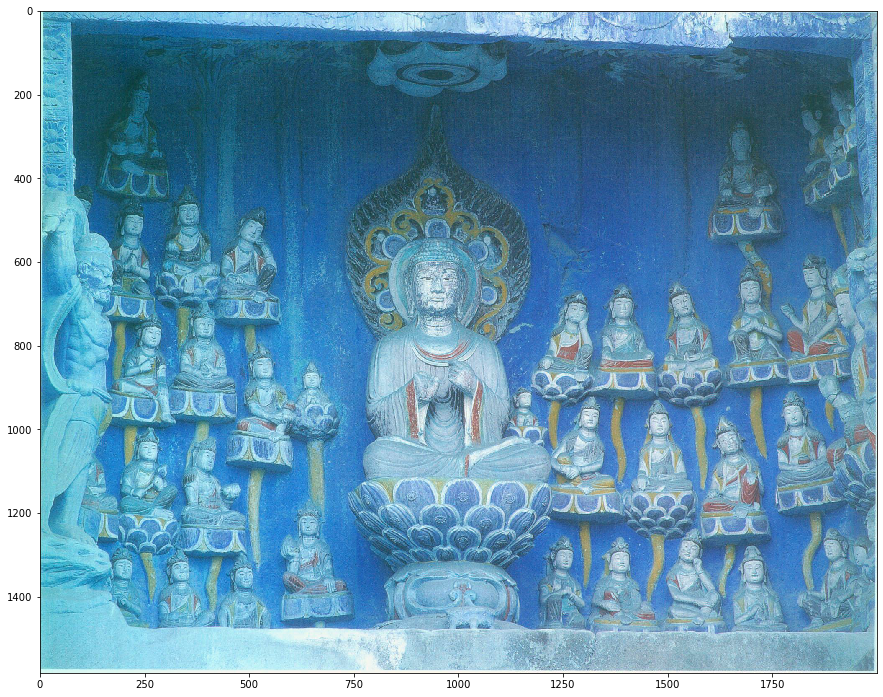

In [213]:

plt.figure(figsize = (15,15))
image = cv2.imread('./buddha/buddha_encode/112.jpg')
plt.imshow(image)

In [154]:
for row in range(array1.shape[0]):
    cv2.rectangle(image, (array1[row,0], array1[row,1]), (array1[row,2], array1[row,3]), (0, 0, 255), 2)

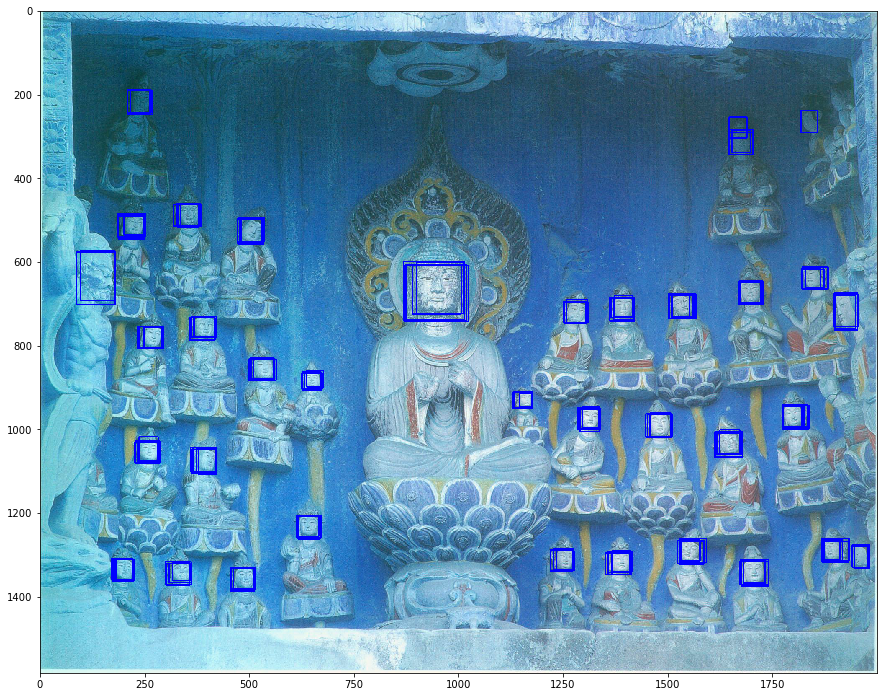

In [155]:
plt.figure(figsize = (15,15))
plt.imshow(image)

In [187]:
area = []

for row in range(array2.shape[0]):
    
    pp = array2[row,:]
    
    if (pp[0] > 2000):
        print(pp)
    if (pp[2] > 2000):
        print(pp)
    if (pp[1] > 1582):
        print(pp) 
    if (pp[3] > 1582):
        print(pp)
    

[2002  693 2045  743]
[2002  693 2045  743]
[2136  581 2184  637]
[2136  581 2184  637]


In [177]:
min(area)

1840

In [178]:
max(area)

20502

In [179]:
20501/1840

11.141847826086957

In [181]:
a

array([1130,  911, 1176,  951])

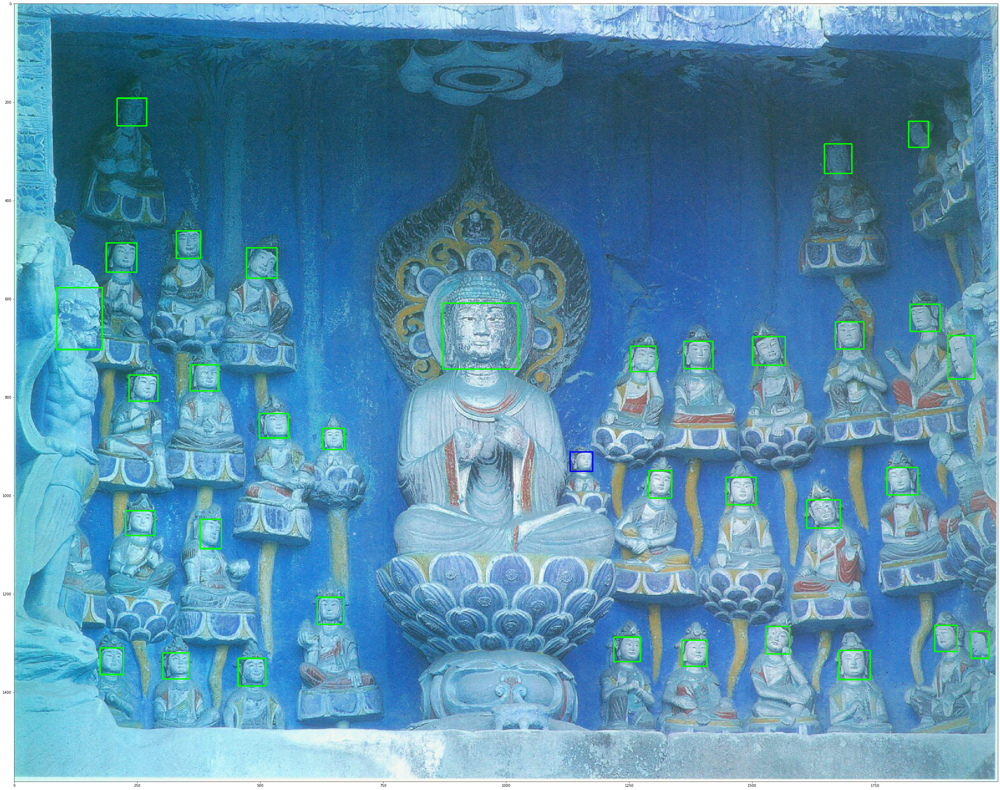

In [183]:
cv2.rectangle(image, (a[0], a[1]), (a[2], a[3]), (0, 0, 255), 2)
plt.figure(figsize = (50,50))
plt.imshow(image)

In [184]:
image.shape

(1582, 2000, 3)

In [189]:
buddha_csv['pic_id'][5]

6

In [192]:
buddha_statue_face_dic = {}

In [206]:
for i in buddha_csv['pic_id']:
    if i in dic_modified:
        buddha_statue_face_dic[i] = dic_modified[i]
    
    

In [207]:
len(buddha_statue_face_dic)

651

In [214]:
np.save('buddha_statue_face.npy', buddha_statue_face_dic)